In [21]:
#
import subprocess
import shlex
import pandas as pd
import numpy as np
import glob

treefile = './dengue/dengue_all.aln.fasta.treefile'

alnfile = './dengue/dengue_all.aln.fasta'

events = './dengue/*_coevmat.pkl'
eventmats = glob.glob(events)

In [2]:

#collapse codons
#use blastx to map to prot
qfile =  './dengue/dengue_refgeno.fasta'

def runblastx( qseq , outannot = alnfile+'blastout.txt' , outfmt = None ):
    if outfmt is None:
        outfmt = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ]
        outfmt =  ' "10 ' + ''.join([fmt+ ' ' for fmt in outfmt]) + ' " '
        print(outfmt)
    args = 'blastx -query '+ qfile + ' -db ./dengue/dengue_prots -outfmt' + outfmt + ' -out ' + outannot  
    p = subprocess.run( shlex.split(args) )
    return p , outannot
out = alnfile+'blastout.txt'
p,annot = runblastx(qfile  )

annotation = pd.read_csv( out , header = None )
annotation.columns = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ] 
annotation = annotation[ annotation['evalue'] < 10**-3 ]
print(annotation)
print(len(annotation), ' orfs detected')
annotation.to_csv( alnfile +'annotation.csv'  )
#make annotation for dengue orfs


 "10 qseqid sseqid qlen slen qstart qend qframe evalue  " 
     qseqid                              sseqid   qlen  slen  qstart   qend  \
0  FJ639811  lcl|NC_001474.2_prot_NP_056776.2_1  10684  3391      73  10248   

   qframe  evalue  
0       1     0.0  
1  orfs detected


In [13]:
#
from Bio import Seq , SeqIO
rows = []
for ID in annotation.sseqid.unique():
    #print(annotation[annotation.sseqid == ID ].iloc[0])
    sub = annotation[annotation.sseqid == ID ]
    rows.append(sub.index[0] ) 
annotation = annotation.loc[rows]
print(len(annotation))
rows = []
for ID in annotation.qstart.unique():
    sub = annotation[annotation.qstart == ID ]
    rows.append(sub.index[0] )
annotation = annotation.loc[rows]
print(len(annotation))
genes =  {}
prots = {}
#parse full reference dengue genome
qseq = next(SeqIO.parse( './dengue/dengue_refgeno.fasta' , 'fasta'))
print(qseq)
print(len(qseq))
for i,r in annotation.iterrows():
    genes[i] = qseq[r.qstart-1:r.qend-1]
    #print(genes[i])
    prots[i] = genes[i].translate( )
    annotation = annotation.sort_values( ['qstart'] )
annotation['prots'] = annotation.index.map(prots)
annotation['genes'] = annotation.index.map(genes)
annotation['prots'] =annotation['prots'].map(lambda x : ''.join(x).strip())
annotation['genes'] = annotation['genes'].map(lambda x : ''.join(x).strip())
annotation = annotation[annotation.slen < 2000]
aln_regions = np.array(list(zip(list(annotation.qstart),list(annotation.qend))))
#aln_regions= aln_regions[1:,:]
aln_len = np.array(list( annotation.qend - annotation.qstart))
annotation = pd.DataFrame.sort_values(annotation, by='qstart')
print(annotation)


0
0
ID: FJ639811
Name: FJ639811
Description: FJ639811 |Homo sapiens|Venezuela|2005
Number of features: 0
Seq('ACAAGAACAGTTTCGAATCGGAAGCTTGCTTAACGTAGTTCTAACAGTTTTTTA...AAT')
10684
Empty DataFrame
Columns: [qseqid, sseqid, qlen, slen, qstart, qend, qframe, evalue, prots, genes]
Index: []


In [22]:
from sklearn.cluster import *
import scipy
import copy
import numpy as np
from numpy import linalg as LA
from matplotlib import pyplot as plt
from Bio import AlignIO
import random
import pickle
import h5py
import itertools
import dendropy
import numpy as np
import seaborn as sns
import os
import seaborn as sns
jk_iterations = 50
mapping = {'A':0 , 'T':1 , 'C':2 ,'G':3 }
os.environ['MKL_ENABLE_INSTRUCTIONS'] = 'AVX2'

In [23]:
print(eventmats)

['./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AG_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GA_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CA_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GT_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CG_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AT_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_TA_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GC_coevmat.pkl', './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_TG_coevmat.pkl', './dengue/dengue_all.aln.fastasparse

In [24]:
if os.path.exists(alnfile +'.h5'):
    with h5py.File(alnfile +'.h5', 'r') as hf:
        align_array = hf['MSA2array'][:]


In [25]:
tree = dendropy.Tree.get(
    path=treefile,
    schema='newick')
treelen = tree.length()
treenodes = len(tree.nodes())
print('nodes',treenodes)
print('length',treelen)

nodes 8600
length 11.799060206899613


./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AG_coevmat.pkl
556608.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GA_coevmat.pkl
501552.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CA_coevmat.pkl
95276.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GT_coevmat.pkl
43476.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CG_coevmat.pkl
39605.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AT_coevmat.pkl
95775.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_TA_coevmat.pkl
75441.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GC_coevmat.pkl
53373.0
./dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_TG_coevmat.pk

<AxesSubplot:>

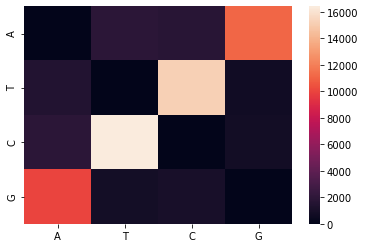

In [26]:

transitionmat = np.zeros( (4,4))

#the number of actual events recorded should be number of transitions recorded / jk_iterations
coevmats_raw = {}
prefix = './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_transition_'
for outsankof in eventmats:
    print(outsankof)
    transition_type = outsankof.replace(prefix  , '')
    transition_type = transition_type.replace( '_coevmat.pkl' , '')
    transition_type = transition_type.replace("'" , '')
    
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    
    print(np.sum(coevmat))
    row = mapping[ transition_type[0] ]
    col = mapping[ transition_type[1] ]
    transitionmat[row,col] = coevmat.sum()
    transitionmat[row,col]/= jk_iterations
    coevmat/=jk_iterations
    coevmats_raw[transition_type] = coevmat.todense()

sns.heatmap(transitionmat, xticklabels= mapping.keys( ) , yticklabels=mapping.keys())  

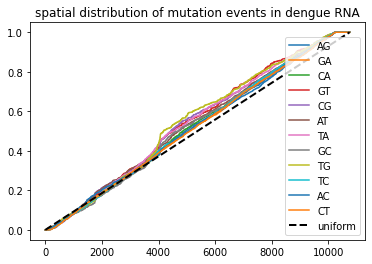

In [27]:
for outsankof in eventmats:

    transition_type = outsankof.replace(prefix  , '')
    transition_type = transition_type.replace( '_coevmat.pkl' , '')
    transition_type = transition_type.replace("'" , '')
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    coevmat = coevmat.todense()
    
    sumv = np.sum(coevmat , axis = 0)
    cdf = np.array( np.cumsum(sumv) / np.sum(sumv))
    plt.plot( cdf[0] , label= transition_type  )
    
cdf_uniform = np.cumsum(np.ones(len(cdf.ravel())) ) / np.sum(len(cdf.ravel()))

plt.plot(cdf_uniform, lw = 2 , ls = 'dashed' , c = 'black' , label= 'uniform')
plt.legend()
plt.title( 'spatial distribution of mutation events in dengue RNA' )
plt.show()

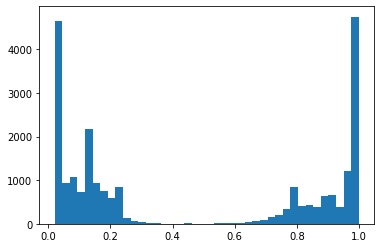

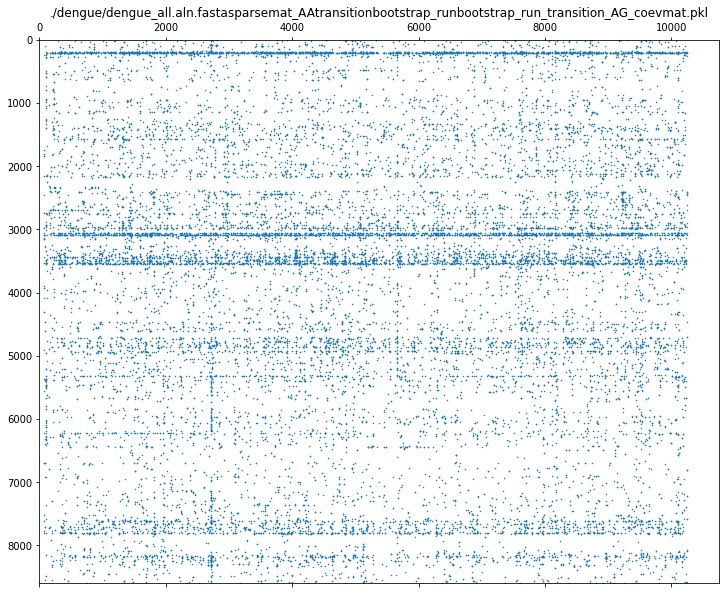

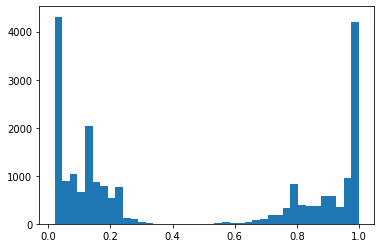

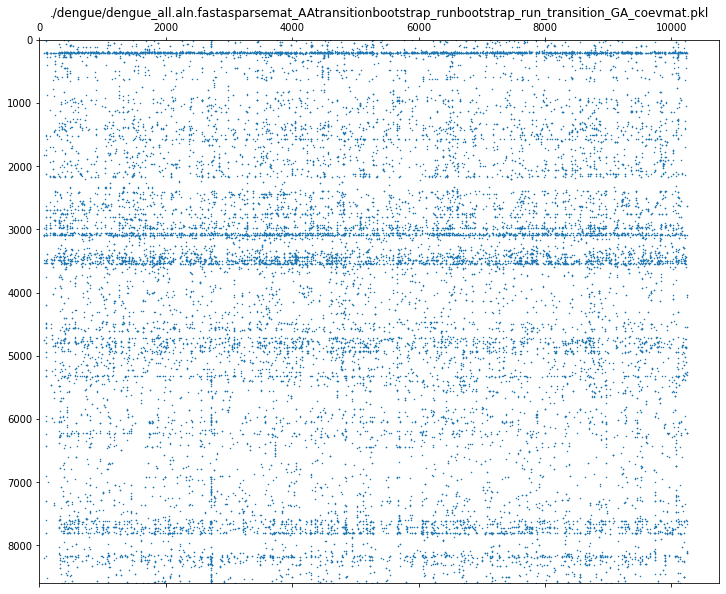

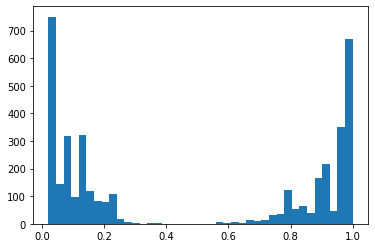

...

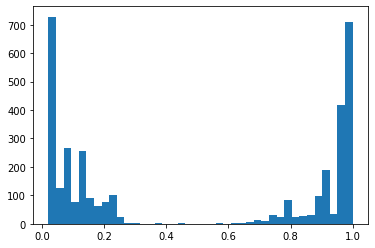

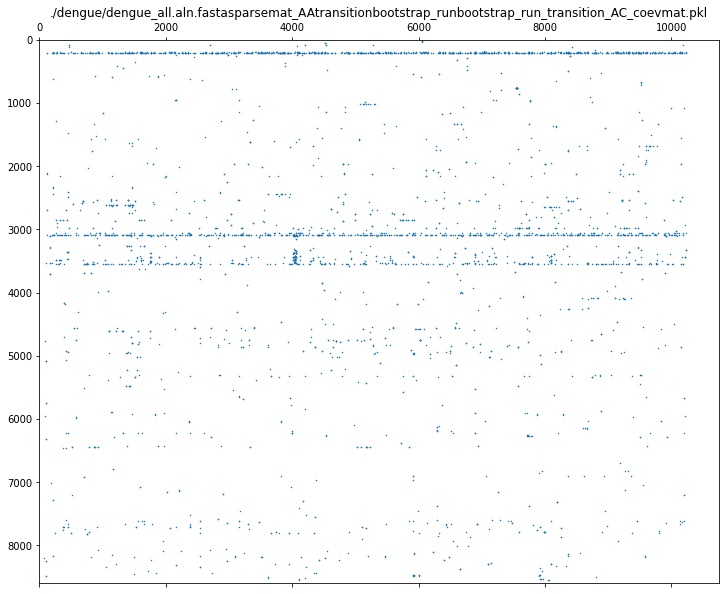

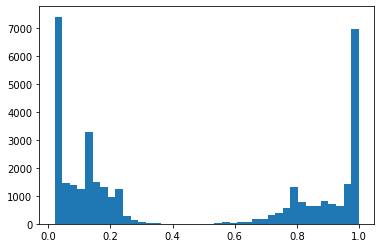

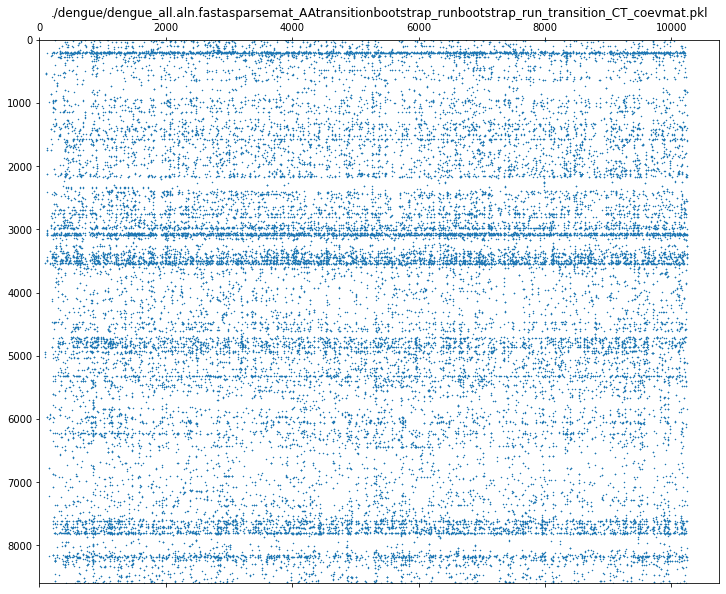

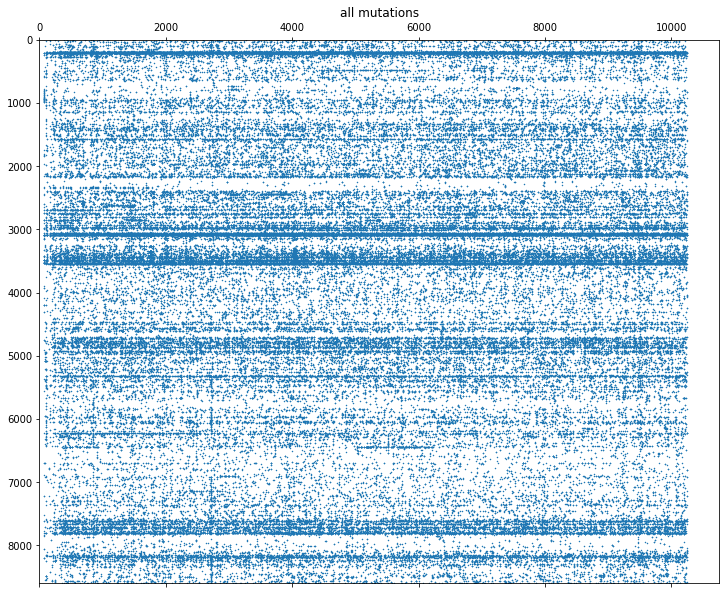

In [28]:
tensor = []
coevmats_raw = {}
thresh_mats = .2
for i,outsankof in enumerate(eventmats):
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    coevmat = coevmat.todense()
    coevmat/= jk_iterations 
    if i == 0:
        globalmat_thresh = coevmat
        globalmat_thresh[thresh_mats > globalmat_thresh ] = 0        
    else:
        coevmat[thresh_mats > coevmat] = 0
        globalmat_thresh+= coevmat


for i,outsankof in enumerate(eventmats):
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    tensor.append( coevmat )
    coevmat = coevmat.todense()
    coevmat/= jk_iterations 
    if i == 0:
        globalmat = coevmat
    else:
        globalmat+= coevmat
    
    transition_type = outsankof.replace(prefix  , '')
    transition_type = transition_type.replace( '_coevmat.pkl' , '')
    transition_type = transition_type.replace("'" , '')
    coevmats_raw[transition_type] = coevmat
    
    
    plt.hist( coevmat[coevmat>0].flat , bins = 40 )
    plt.show()
    plt.figure(figsize=(20,10))
    plt.spy(coevmat, markersize= .5)
    plt.title(outsankof)
    plt.show()
plt.figure(figsize=(20,10))
plt.title('all mutations')
plt.spy(globalmat,markersize= .5)
plt.show()

bigstack = np.vstack(tensor)

(8600, 10755, 380)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


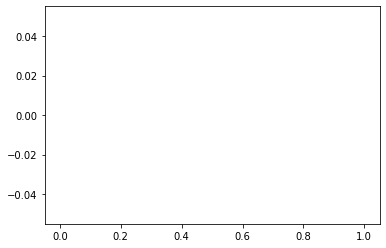

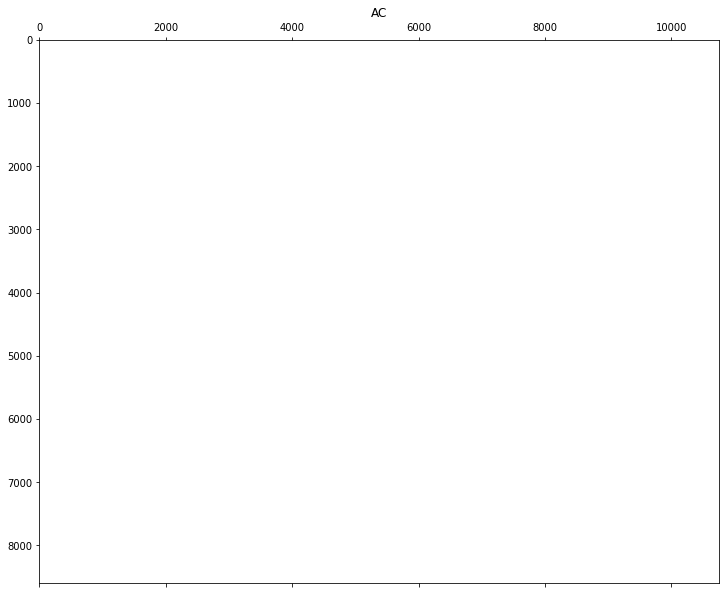

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


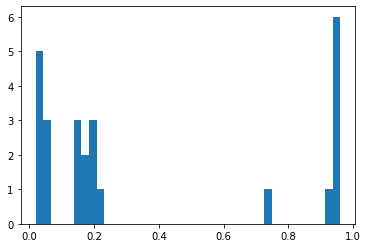

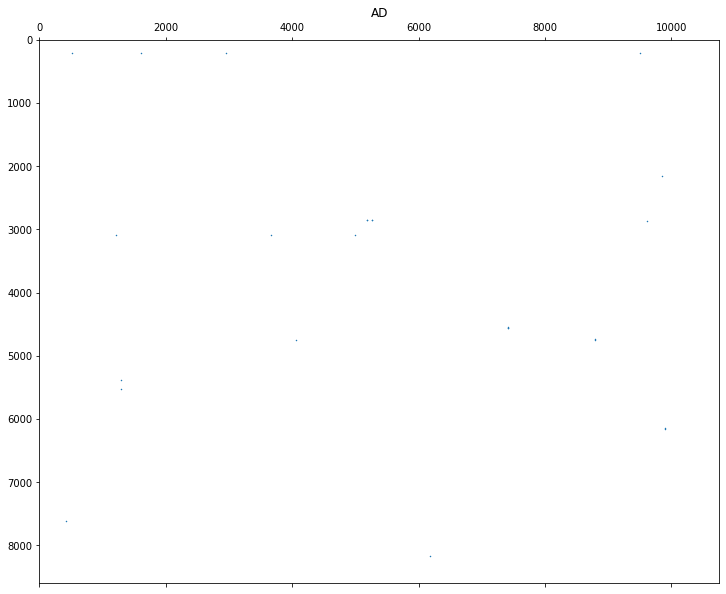

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


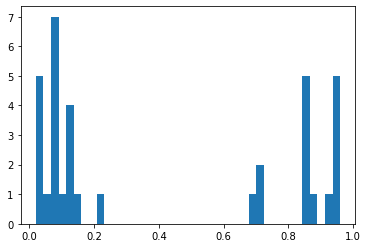

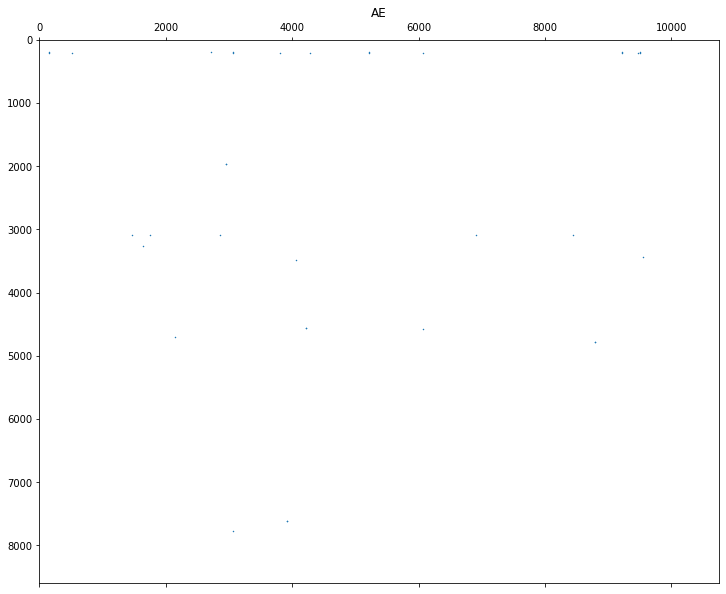

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


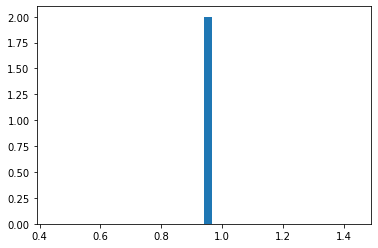

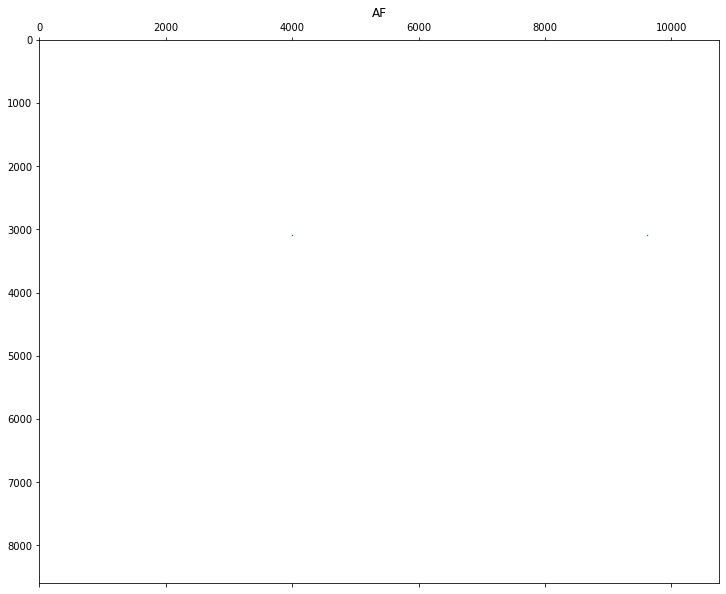

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


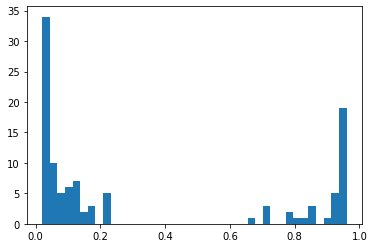

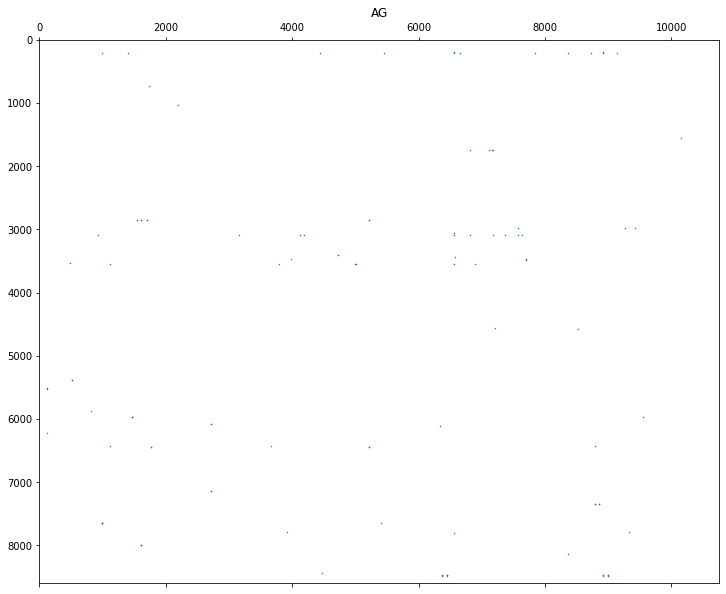

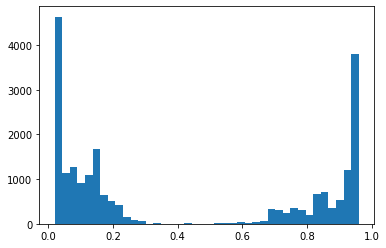

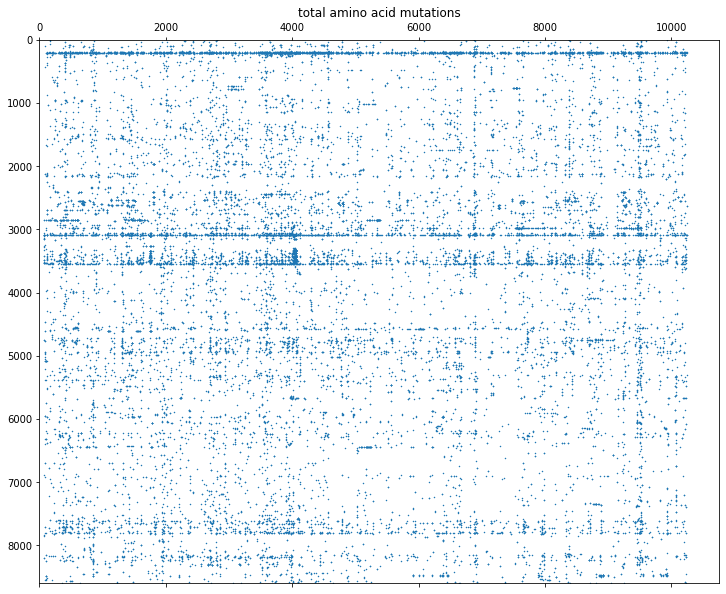

In [43]:
#load sparse ND array
ProteinAlphabet = [ 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y' ]
allowed_AA_transitions = [ c1+c2 for c1 in ProteinAlphabet for c2 in ProteinAlphabet  if c1!= c2]
transitiondict_AA = {  c : i  for i,c in enumerate( allowed_AA_transitions )  }
rev_transitiondict_AA = dict( zip(transitiondict_AA.values(), transitiondict_AA.keys()))

outsankof = './dengue/dengue_all.aln.fastasparsemat_AAtransitionbootstrap_runbootstrap_run_coevmat_AAmutations.pkl'

bootstraps = 50
#condense to global mat
with open( outsankof , 'rb') as matin:
    AAtensor = pickle.loads(matin.read())[1]/bootstraps
    print(AAtensor.shape)
    
    for i in range( AAtensor.shape[2] ):
        if i < 5:
            coevmat = AAtensor[:,:,i].todense()
            print(coevmat)
            plt.hist( coevmat[coevmat>0].flat , bins = 40 )
            plt.show()
            plt.figure(figsize=(20,10))
            plt.spy(coevmat, markersize= .5)
            plt.title(rev_transitiondict_AA[i])
            plt.show()
        if i == 0:
            AAmat =  AAtensor[:,:,i].todense()
        else:
            AAmat +=  AAtensor[:,:,i].todense()

plt.hist( AAmat[AAmat>0].flat , bins = 40 )
plt.show()
plt.figure(figsize=(20,10))
plt.spy(AAmat, markersize= .5)
plt.title('total amino acid mutations')
plt.show()

thresh = .5
AAmat[AAmat<thresh]=0

plt.figure(figsize=(20,10))
plt.spy(AAmat, markersize= .5)
plt.title('total amino acid mutations')
plt.show()

In [31]:
#use tree to blur eventmat
from Bio import AlignIO
tree = dendropy.Tree.get(
    path=treefile,
    schema='newick')
col = 525
aln_col = align_array[:,col]
def clipID(ID):
    return ID.replace('/',' ')

msa = AlignIO.read(alnfile , format = 'fasta')    
IDs = {i:clipID(rec.id) for i,rec in enumerate(msa)}
#IDs = {i:rec.id for i,rec in enumerate(msa)}
IDindex = dict(zip( IDs.values() , IDs.keys() ) )
matsize = len(tree.nodes())
#add chars to leaves
for i,l in enumerate(tree.leaf_nodes()):
    if l.taxon.label in IDindex:
        l.taxon.label += ' '+ aln_col[IDindex[l.taxon.label]].decode()

#add events
for i,n in enumerate(tree.nodes()):
    if globalmat[i,col]>0:
        n.label = str( globalmat[i,col] )
    else:
        n.label = ''
#vis w event proba 
#tree.print_plot( show_internal_node_labels = True , width = 100)

8600
nodes


/home/cactuskid/miniconda3/envs/tfnew/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


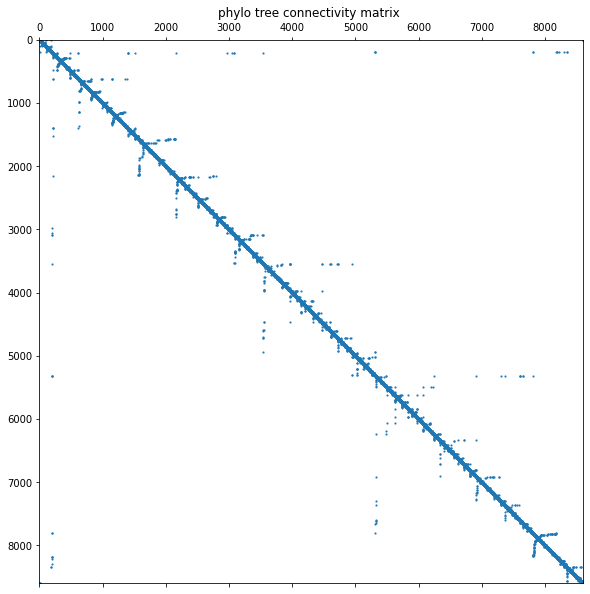

In [32]:
for i,n in enumerate(tree.nodes()):
    n.matrow = i
    n.symbols = None
    n.scores = None
    n.event = None
    n.char = None

matsize = len(tree.nodes())
print(matsize)
print('nodes')

#blur w connectivity mat
blurfactor =  .25
bluriter = 2

connectmat = scipy.sparse.csc_matrix((len(tree.nodes()), len(tree.nodes() ) ) )
index = np.array([ [n.matrow, c.matrow ] for n in tree.nodes() for c in n.child_nodes()])
lengths = np.array([ c.edge_length for n in tree.nodes() for c in n.child_nodes()])
total_len = np.sum(lengths)
#fill diagonal
#index = np.vstack( [index , np.array([ [n.matrow, n.matrow ] for n in tree.nodes() ]) ] )

connectmat[index[:,0],index[:,1]] = 1
connectmat[index[:,1],index[:,0]] = 1
connectmat = connectmat.todense()
np.fill_diagonal(connectmat , 1)

plt.figure( figsize=(10,10))
plt.title( 'phylo tree connectivity matrix ' )
plt.spy(connectmat, markersize= 1)
plt.show()

In [33]:
######important 
mapping = {'A':0 , 'T':1 , 'C':2 ,'G':3 }
transitions = [ char1+char2  for char1 in mapping.keys() for char2 in mapping.keys()]
transitionmap = { t:i for i,t in enumerate(transitions) }
print(transitionmap)
print(mapping)

{'AA': 0, 'AT': 1, 'AC': 2, 'AG': 3, 'TA': 4, 'TT': 5, 'TC': 6, 'TG': 7, 'CA': 8, 'CT': 9, 'CC': 10, 'CG': 11, 'GA': 12, 'GT': 13, 'GC': 14, 'GG': 15}
{'A': 0, 'T': 1, 'C': 2, 'G': 3}


In [34]:

#####define the aln row and structure here, for dengue they should all be the same
selected_strain = list(IDindex.keys())[0]
print(IDindex[selected_strain])
print(selected_strain)
print(align_array[0])
#filter to columns without gaps
msa_row = list(align_array[0])
print(len(msa_row))
non_gap = np.where( align_array[IDindex[selected_strain]] != b'-')[0]
print(non_gap)

print(non_gap.shape)
print(align_array[IDindex[selected_strain],non_gap])

0
GQ868560 1-10690
[b'-' b'-' b'-' ... b'-' b'-' b'-']
10755
[   22    23    24 ... 10729 10730 10731]
(10690,)
[b'A' b'C' b'A' ... b'A' b'T' b'G']


In [35]:
from Bio.PDB import MMCIFParser, PDBParser , PDBIO
from Bio.PDB.mmcifio import MMCIFIO
parser = PDBParser()
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    structure = parser.get_structure("3j27", "./dengue/3j27.pdb")
io=PDBIO()
io.set_structure(structure)

In [36]:
#grab AA chain residues

totalatoms = { c.id : [ r for r in c.get_residues() ] for c in structure.get_chains() }


In [37]:
#recover amino acid chains in struct
from Bio import SeqUtils
converter = SeqUtils.IUPACData.protein_letters_3to1
converter = { res.upper():converter[res] for res in converter}
print(converter)
chain_sequences = { c.id : ''.join(  [ converter[ r.get_resname()] for r in c.get_residues() if 'CA' in r ] ) for c in structure.get_chains() }
chain_sequences = { c: chain_sequences[c] for c in chain_sequences if len(chain_sequences[c])> 0 }
print(chain_sequences)
with open( './dengue/struct_chains.fasta', 'w') as fastout:
    for c in chain_sequences:
        fastout.write( '> '+c + '\n' + chain_sequences[c] + '\n' )

{'ALA': 'A', 'CYS': 'C', 'ASP': 'D', 'GLU': 'E', 'PHE': 'F', 'GLY': 'G', 'HIS': 'H', 'ILE': 'I', 'LYS': 'K', 'LEU': 'L', 'MET': 'M', 'ASN': 'N', 'PRO': 'P', 'GLN': 'Q', 'ARG': 'R', 'SER': 'S', 'THR': 'T', 'VAL': 'V', 'TRP': 'W', 'TYR': 'Y'}
{'A': 'MRCIGISNRDFVEGVSGGSWVDIVLEHGSCVTTMAKNKPTLDFELIETEAKQPATLRKYCIEAKLTNTTTDSRCPTQGEPSLNEEQDKRFVCKHSMVDRGWGNGCGLFGKGGIVTCAMFTCKKNMKGKVVQPENLEYTIVITPHSGEEHAVGNDTGKHGKEIKITPQSSITEAELTGYGTVTMECSPRTGLDFNEMVLLQMENKAWLVHRQWFLDLPLPWLPGADTQGSNWIQKETLVTFKNPHAKKQDVVVLGSQEGAMHTALTGATEIQMSSGNLLFTGHLKCRLRMDKLQLKGMSYSMCTGKFKVVKEIAETQHGTIVIRVQYEGDGSPCKIPFEIMDLEKRHVLGRLITVNPIVTEKDSPVNIEAEPPFGDSYIIIGVEPGQLKLNWFKKGSSIGQMIETTMRGAKRMAILGDTAWDFGSLGGVFTSIGKALHQVFGAIYGAAFSGVSWIMKILIGVIITWIGMNSRSTSLSVSLVLVGVVTLYLGVMVQA', 'B': 'SVALVPHVGMGLETATETWMSSEGAWKHAQRIETWILRHPGFTIMAAILAYTIGTTHFQRALIFILLTAVAP', 'C': 'MRCIGISNRDFVEGVSGGSWVDIVLEHGSCVTTMAKNKPTLDFELIETEAKQPATLRKYCIEAKLTNTTTDSRCPTQGEPSLNEEQDKRFVCKHSMVDRGWGNGCGLFGKGGIVTCAMFTCKKNMKGKVVQPENLEYTIVITPHSGEEHAVGNDTGKHGKEIKITPQ

In [38]:
#measure from CA to CA
distmats = {}
for chain in chain_sequences:
    distmats[chain] = np.array( [[ a1['CA'] - a2['CA']  if (i<j and 'CA' in a1 and 'CA' in a2) else 0 for i,a1 in enumerate(totalatoms[chain])] for j,a2 in enumerate(totalatoms[chain]) ] )
#add upper triangular 
for chain in distmats:
    distmats[chain] += distmats[chain].T
    
distmats_inter = {}
#get interchain dists for contacts
for chain1,chain2 in itertools.combinations(chain_sequences,2):
    distmats_inter[(chain1,chain2)] = np.array( [[ a1['CA'] - a2['CA']  if 'CA' in a1 and 'CA' in a2 else 0 for i,a1 in enumerate(totalatoms[chain1])] for j,a2 in enumerate(totalatoms[chain2]) ] )


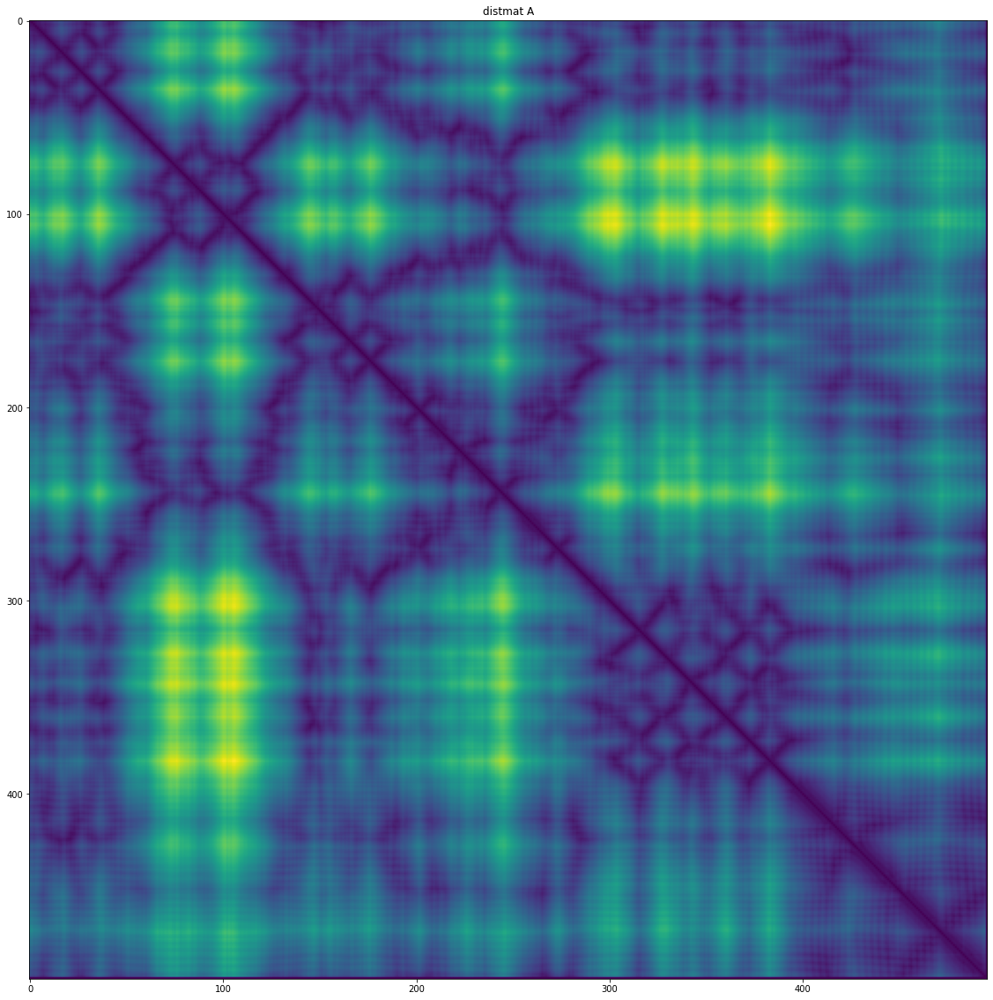

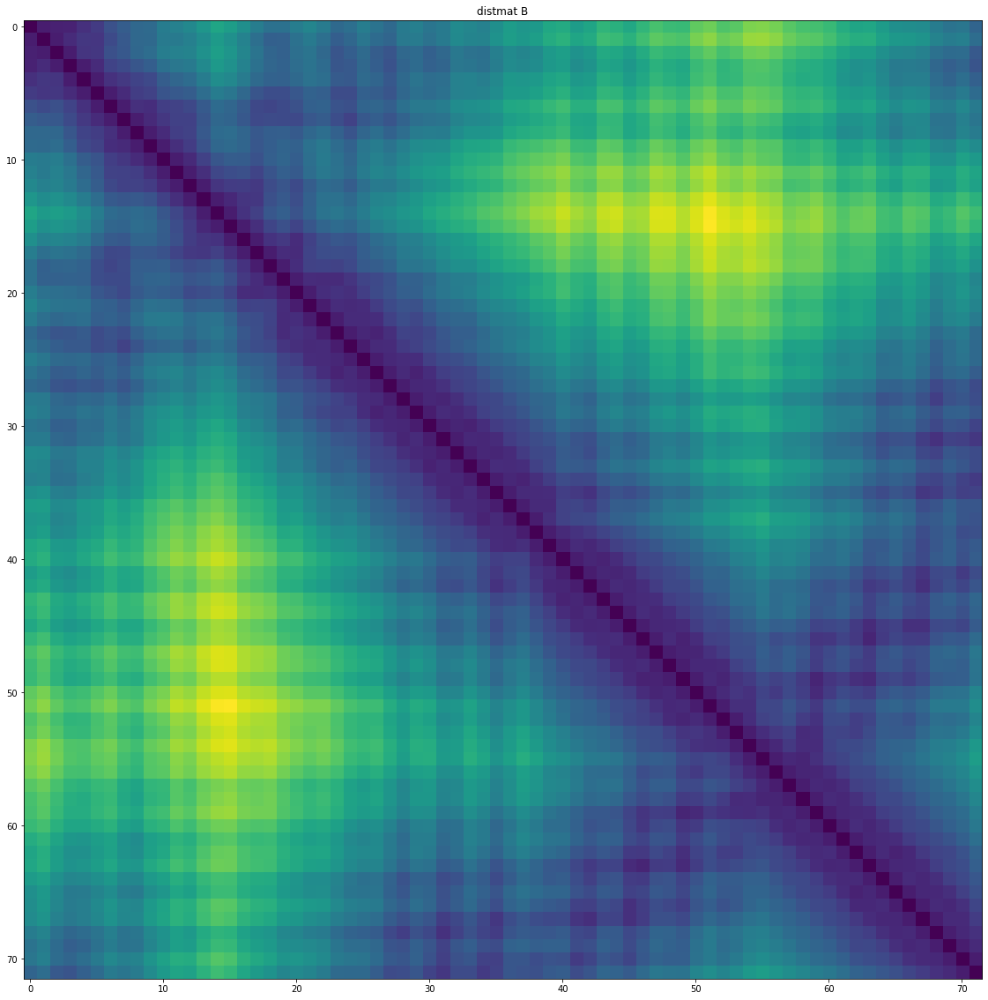

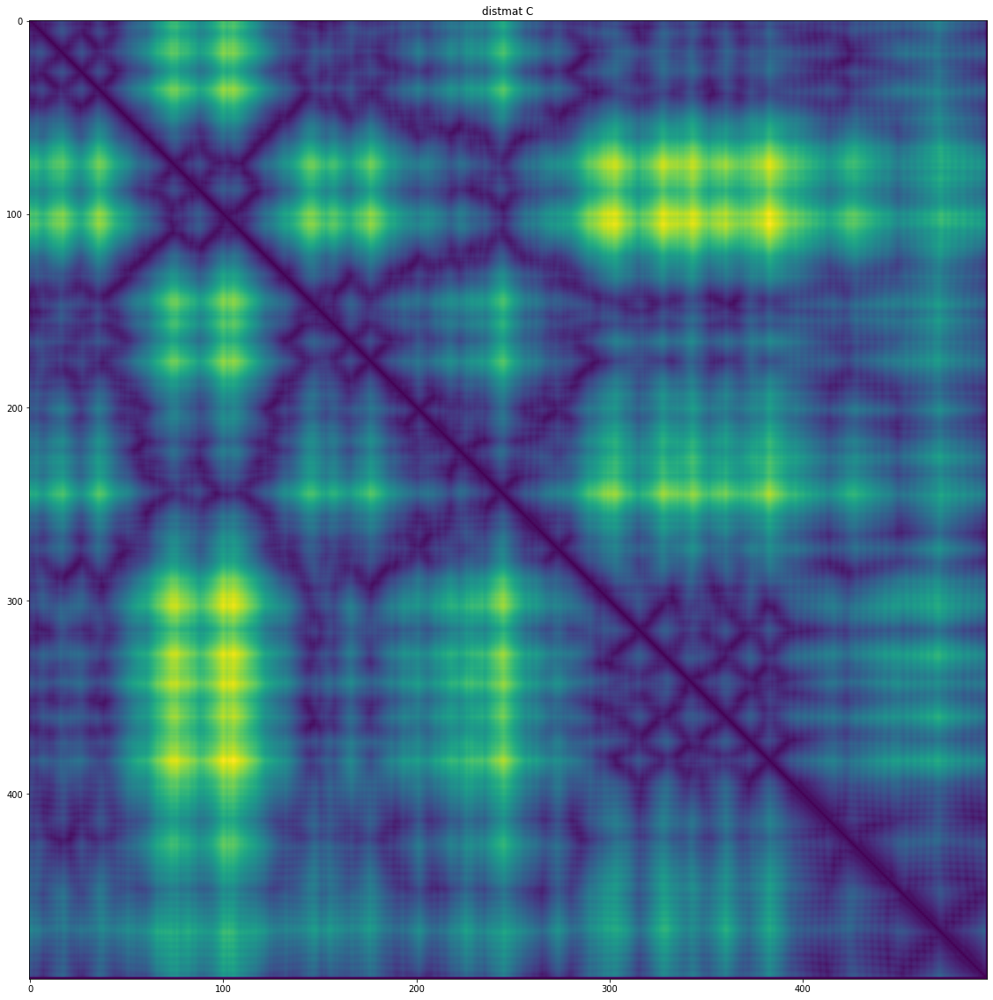

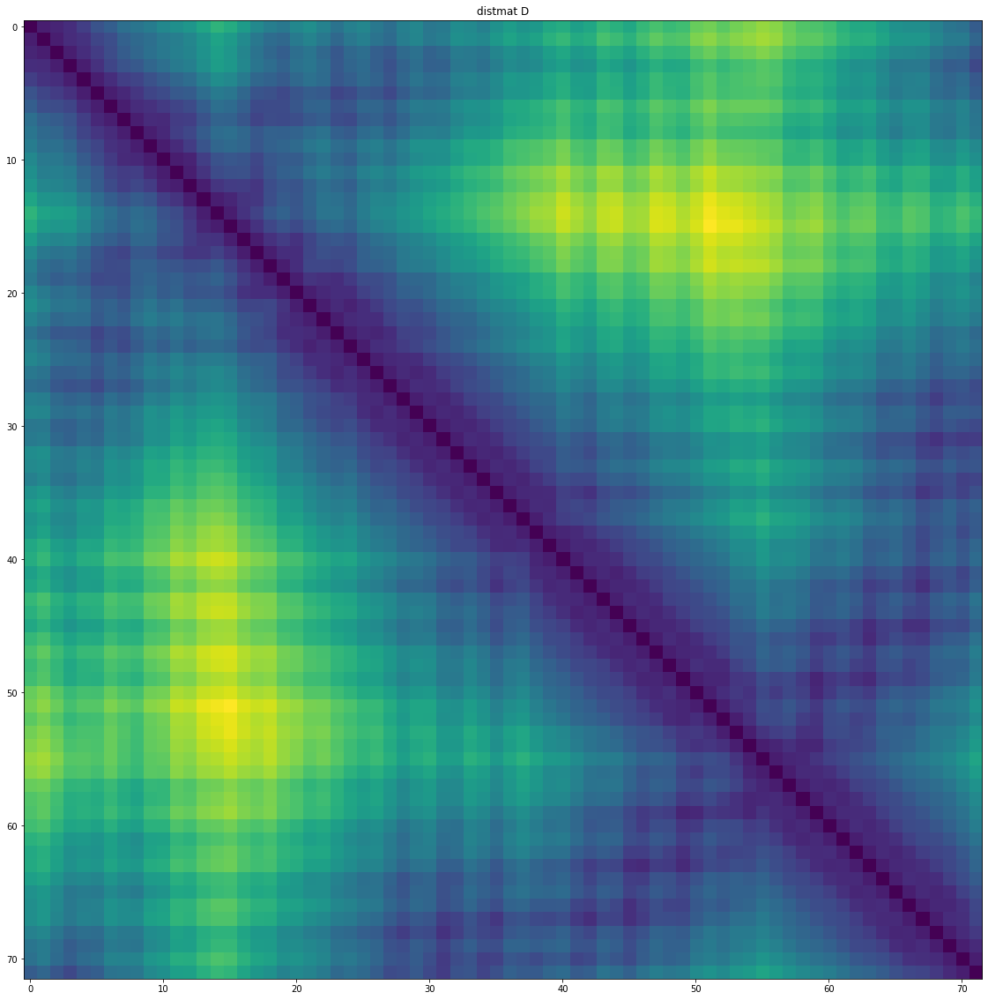

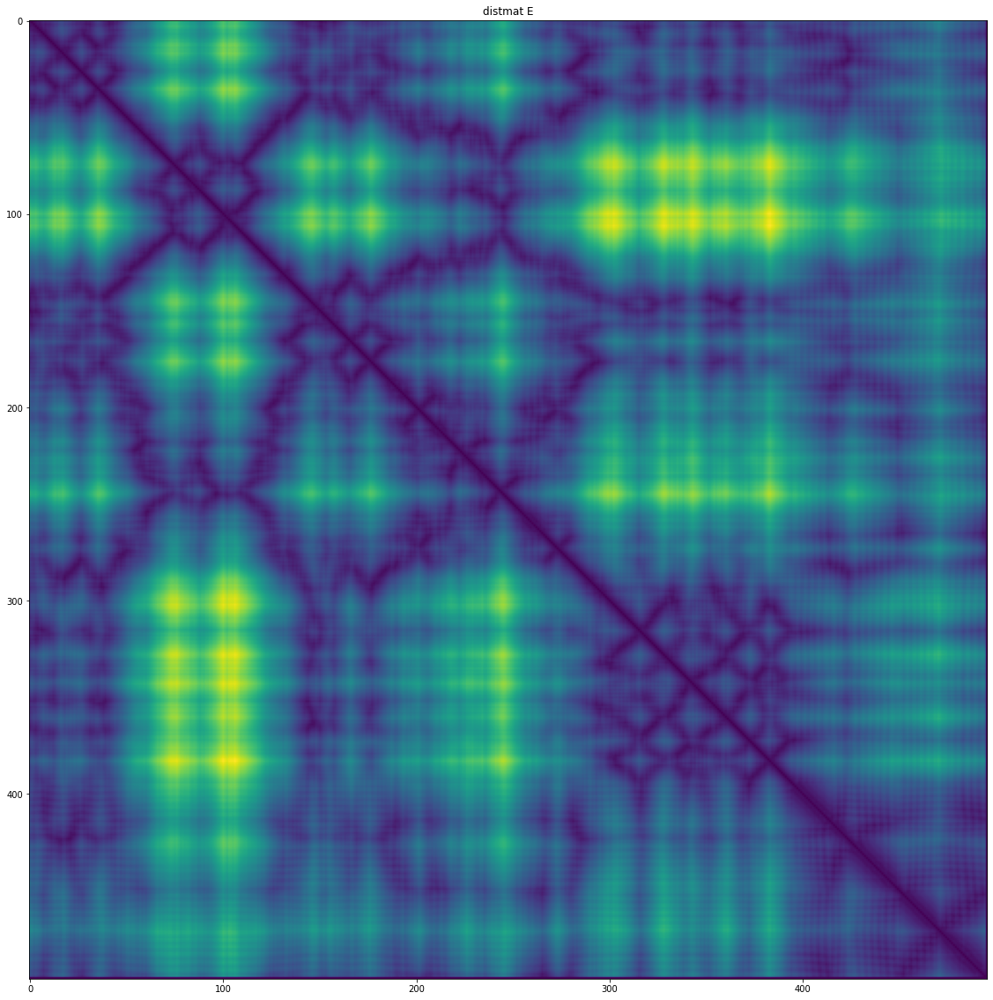

...

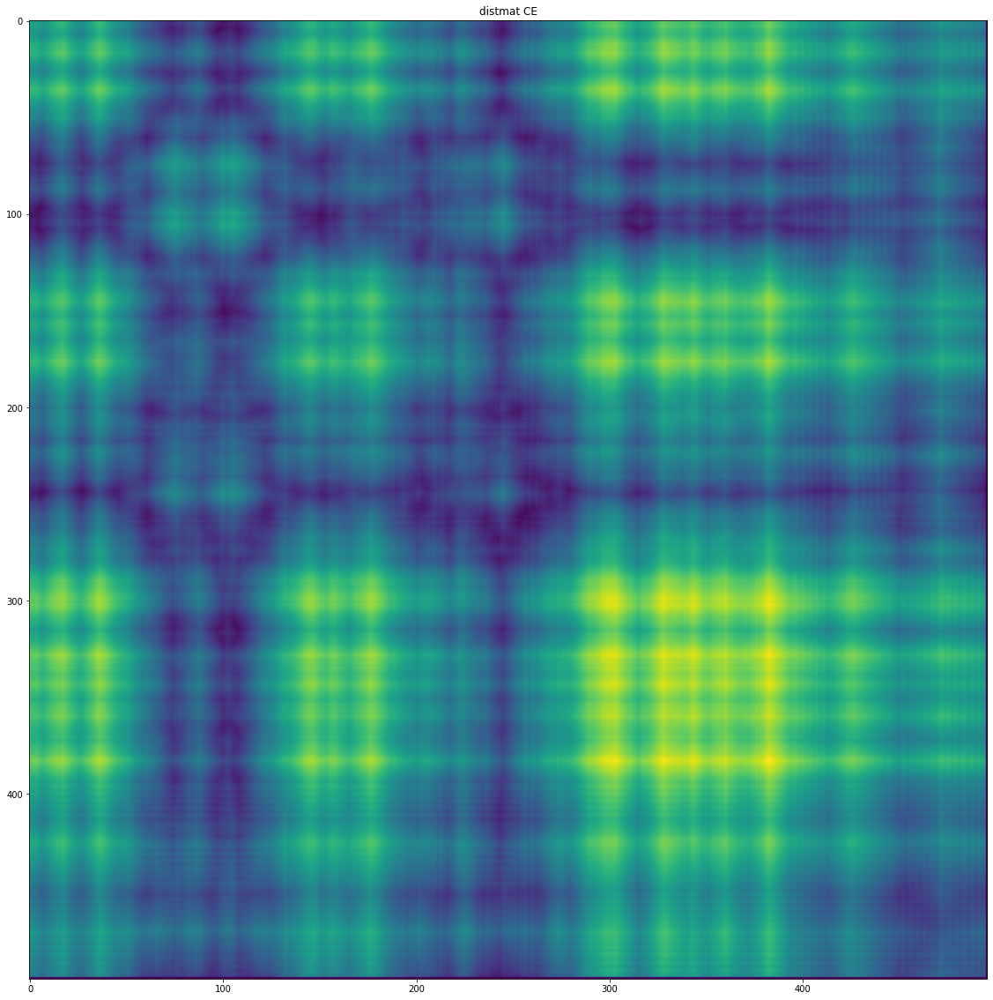

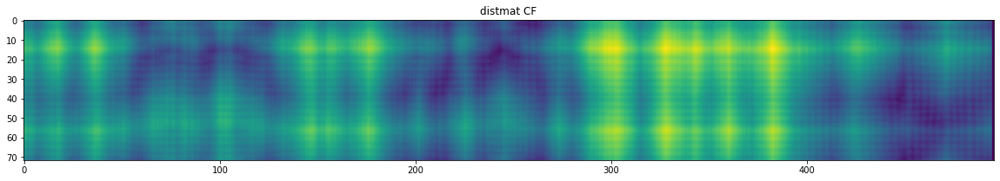

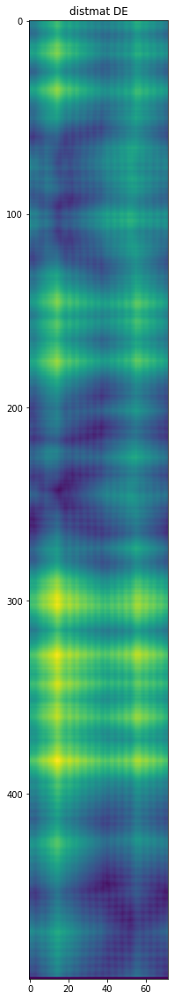

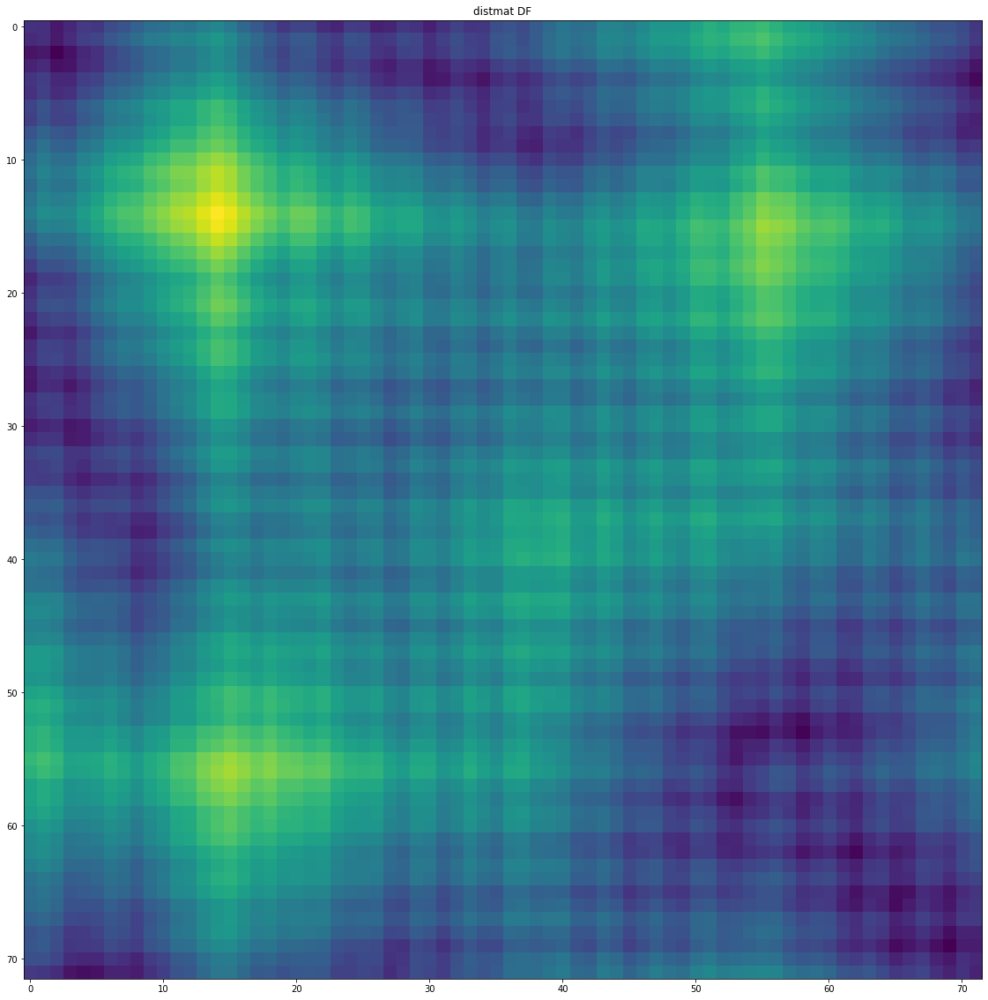

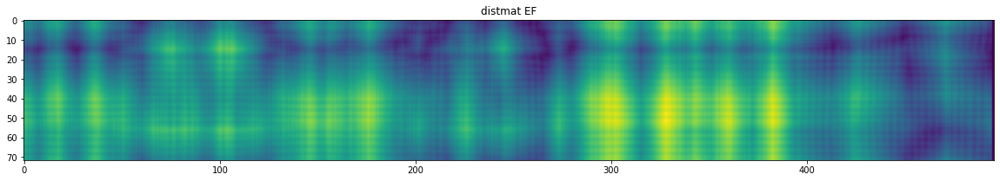

In [39]:
show_distmats = True

if show_distmats == True:
    for i,chain in enumerate(distmats):
        if distmats[chain].shape[0]>0:
            plt.figure(figsize= (20,20))
            plt.title( 'distmat ' + chain )
            plt.imshow(distmats[chain])
            plt.show()
    for i,chains in enumerate(distmats_inter):
        if distmats_inter[chains].shape[0]>0:
            plt.figure(figsize= (20,20))
            plt.title( 'distmat ' + chains[0]+ chains[1] )
            plt.imshow(distmats_inter[chains])
            plt.show()



In [55]:
#find the amino acid chains in the structs
import subprocess
import shlex
import pandas as pd 
import numpy as np
#collapse codons
#use blastx to map to prot
qfile =  './dengue/dengue_refgeno.fasta'
struct = '3j27'

def makeblastdb( fasta , dbtype = 'prot')
    args = 'makeblastdb -in '+ fasta + ' -dbtype '+  
    p = subprocess.run( shlex.split(args) )
    return p, fasta.split('.')[0]

def runblastx( qseq , outannot = alnfile+'blastout.txt' , db ='./dengue/dengue_structs' , outfmt = None ):
    if outfmt is None:
        outfmt = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ]
        outfmt =  ' "10 ' + ''.join([fmt+ ' ' for fmt in outfmt]) + ' " '
        print(outfmt)
    args = 'blastx -query '+ qfile + ' -db '+db+' -outfmt' + outfmt + ' -out ' + outannot  
    p = subprocess.run( shlex.split(args) )
    return p , outannot

out = alnfile+'blastout.txt'
p,annot = runblastx(qfile  )

annotation = pd.read_csv( out , header = None )
annotation.columns = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ] 
annotation = annotation[ annotation['evalue'] < 10**-3 ]
annotation['struct'] = struct



print(annotation)
print(len(annotation), ' orfs detected')
annotation.to_csv( alnfile +'struct_annotation.csv'  )
#make annotation for dengue orfs


#find equivalent structures in multimers



 "10 qseqid sseqid qlen slen qstart qend qframe evalue  " 
      qseqid sseqid   qlen  slen  qstart  qend  qframe        evalue struct
0   FJ639811      E  10684   495     913  2397       1  0.000000e+00   3j27
2   FJ639811      C  10684   495     913  2397       1  0.000000e+00   3j27
4   FJ639811      A  10684   495     913  2397       1  0.000000e+00   3j27
6   FJ639811      F  10684    72     688   903       1  1.540000e-31   3j27
8   FJ639811      D  10684    72     688   903       1  1.540000e-31   3j27
10  FJ639811      B  10684    72     688   903       1  1.540000e-31   3j27
6  orfs detected


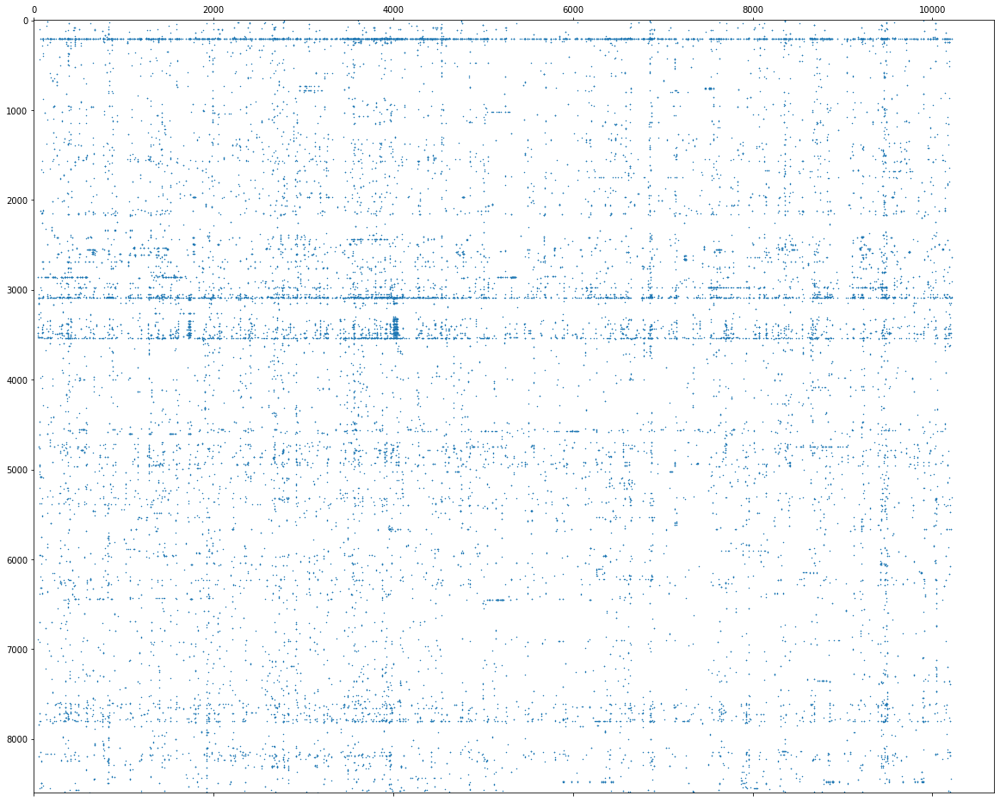

[304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503,

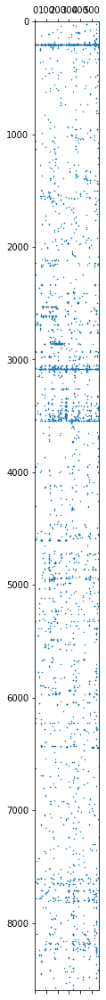

In [175]:
from functools import partial

#select relevant AA mat columns and condense
show_mats = True

#select submat
subAAmat = AAmat[:, non_gap ]
if show_mats == True:
    plt.figure( figsize = ( 20,20))
    plt.spy(subAAmat,markersize= .5)
    plt.show()


    

#sum up the 3 positions of the AA mat by codon
codonmat = np.zeros(( subAAmat.shape[0] , int(subAAmat.shape[1]/3) ) )
for i in range(codonmat.shape[1]):
    pos = 3*i
    codonmat[:,i] = subAAmat[:,pos] + subAAmat[:,pos+1] + subAAmat[:,pos+2]



#find the slices of the codon mat corresponding to each structure and chain   
struct_dict={}
columns_clipped = None
mapping_clipped = {}
mapping_struct = {}
mapping_struct_inv = {}


#only take columns corresponding to structs for control
for i,r in annotation.iterrows():
    #if r.struct not in struct_dict:
    #    struct_dict[struct] ={}
    #sub = annotation[annotation.struct == struct]
    #seqranges = dict(zip( sub.sseqid , list( zip( sub.qstart/3 , sub.qend /3 ) ) ))
    #seqranges = { chain: [ int(pt) for pt in seqranges[chain] ] for chain in seqranges }
    #struct_dict[struct] = seqranges
    #clip[ int(r.qstart/3) , int(r.qend /3 )] = 1
    grab = [ i for i in range(int(r.qstart/3) , int(r.qend /3 ))  if i not in mapping_clipped ]
    print(grab)
    
    if columns_clipped is None:
        mapping_clipped.update(  { c : i  for i,c in enumerate( grab )  } )
    else:
        mapping_clipped.update(  { c : i + columns_clipped.shape[1] for i,c in enumerate( grab )  } )
        
    if columns_clipped is None:
        columns_clipped= codonmat[:,grab]
    else:
        columns_clipped = np.hstack([columns_clipped ,codonmat[:,grab]] )
    
    if r.struct not in mapping_struct:
        mapping_struct[r.struct]={}
        mapping_struct_inv[r.struct]={}
    mapping_struct[r.struct][r.sseqid] = { i : mapping_clipped[c] for i,c in enumerate( range(int(r.qstart/3) , int(r.qend /3 ) ) ) }
    mapping_struct_inv[r.struct][r.sseqid]= { mapping_clipped[c] : i  for i,c in enumerate( range(int(r.qstart/3) , int(r.qend /3 ) ) ) }
if show_mats == True:
    plt.figure( figsize = ( 20,20))
    plt.spy(columns_clipped,markersize= .5)
    plt.show()


In [143]:
import copy
angstrom_cutoff = 15

def define_contacts(mat , angstrom_cutoff = 15 , dot = False ):
    subthresh = copy.deepcopy(mat)
    subthresh[ subthresh < angstrom_cutoff ] = 1 
    subthresh[ subthresh > angstrom_cutoff ] = 0 
    np.fill_diagonal(subthresh , 0)
    if dot == True:
        connected = np.dot(subthresh,subthresh)
        return subthresh,connected
    else :
        return subthresh
#connnectedx , connectedy  = (np.nonzero(connected)[0] ,np.nonzero(connected)[1])

subthresh_mats ={}
chain_equivalencies={}


if struct not in subthresh_mats:
    subthresh_mats[struct]={}
show_contacts = False


for chain in distmats:
    subthresh, connected = define_contacts(distmats[chain] , angstrom_cutoff , dot = True )
    if show_contacts == True:
        plt.figure(figsize=(10,10) )
        plt.title('contact mat '+ chain )
        plt.scatter( np.nonzero(subthresh)[0] ,np.nonzero(subthresh)[1]  , marker= 'o' , alpha = .1 ,  s = 50)
        plt.show()
    subthresh_mats[struct][chain] = { 'thresh':subthresh , 'connected' : connected}

for chain in distmats_inter:
    subthresh = define_contacts(distmats_inter[chain] , angstrom_cutoff , dot = False)
    subthresh_mats[struct][chain] = { 'thresh':subthresh }
    if show_contacts == True:
        plt.figure(figsize=(10,10) )
        plt.title('contact mat '+chain[0] + chain[1])
        plt.scatter( np.nonzero(subthresh)[0] ,np.nonzero(subthresh)[1]  , marker= 'o' , alpha = .1 ,  s = 50)
        plt.show()





In [144]:
from sklearn.manifold import Isomap , MDS , locally_linear_embedding
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans , DBSCAN ,SpectralClustering ,OPTICS , AgglomerativeClustering
import sklearn

In [176]:
def return_clustering(codonmat, calc_isomap = True , scale = True , dbscan = False , xi = 0.035 , samples = 5 , jaccard = True , reductionfactor= .75):
    if scale == True:
        scaler = sklearn.preprocessing.RobustScaler( )
        codonmat = scaler.fit_transform(codonmat.T).T
    if calc_isomap == True:
        try:
            isomap = Isomap( n_neighbors= 25, n_components= int(codonmat.shape[0]*reductionfactor) , eigen_solver='auto', tol=0, 
               max_iter=None, path_method='auto', neighbors_algorithm='auto', n_jobs=-1 )
            #isomap = sklearn.manifold.locally_linear_embedding(n_neighbors=25, n_components=50)
            codonmat = isomap.fit_transform( X=codonmat.T ).T
        except:
            pass
    
    if jaccard == False:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            apb = OPTICS(min_samples=samples, metric='minkowski', p=1.5, metric_params=None, cluster_method='xi', eps=None, xi=xi, predecessor_correction=True, min_cluster_size=2 , algorithm='auto', leaf_size=20, n_jobs=-1)
            cluster_labels_codon = apb.fit_predict(codonmat.T )    
    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            apb = OPTICS(min_samples=samples, metric='jaccard', p=1.5, metric_params=None, cluster_method='xi', eps=None, xi=xi, predecessor_correction=True, min_cluster_size=2 , algorithm='auto', leaf_size=20, n_jobs=-1)
            cluster_labels_codon = apb.fit_predict(codonmat.T )
    
    return cluster_labels_codon

def subcluster( mat , cluster_thresh=10 , indices = None  ,  iter_thresh = 15 , clusterlevel = 'head' , clustiter =0, calc_isomap = False , scale = True , xi = .035 , samples = 5 , verbose = False , jaccard = False  ):
    #break a large cluster into smaller subclusters until avg cluster size is below thresh
    if verbose == True:
        print('clustering' , clusterlevel)
    
    cluster_labels = return_clustering(mat, calc_isomap=calc_isomap  , scale=scale  , dbscan=dbscan  ,xi = xi , samples = samples , jaccard = jaccard)
    
    if verbose == True:
        print('DONE clustering ', clusterlevel)
    if indices is None:
        indices = np.arange(mat.shape[1])
    
    l,c = np.unique(cluster_labels, return_counts= True)
    if len(l) == 1:
        xi += .01
        if verbose == True:
            print(l)
            print('xi',xi)
    if verbose == True:
        print('l',l)
        print('c',c)
    clustering = {  'labels': cluster_labels , 'sub':{} , 'mappings':{}  }
    #if we're over the max recursion
    kmeans = False
    if clustiter < iter_thresh:
        
        for i,label in enumerate(list(l)):
            clustering['mappings'][label] = indices[cluster_labels == label]
            if c[i] > cluster_thresh:
                if verbose == True:
                    print( 'reclustring',label , c[i] )
                    print( 'min samples' , samples )
                #isomap within clusters
                
                #don't split up clusters formed from columns with no events
                
                clustering['sub'][label] = subcluster( mat[:,cluster_labels==label] , cluster_thresh =cluster_thresh ,indices= clustering['mappings'][label] , iter_thresh = iter_thresh , clusterlevel= str(label)+'_'+str(clustiter), samples = samples,  clustiter = clustiter + 1 , calc_isomap = True , jaccard = True ,  xi= xi , scale = scale  )
                samples = max( 2 , samples-1 )
    return clustering

In [177]:
def return_sub(indict, level= 0 ,mapping = None):
    l,c = np.unique(indict['labels'] , return_counts= True)
    for clust in list(l):
        if 'sub' not in indict or clust not in indict['sub']:
            if clust != -1:
                yield indict['mappings'][clust]  
        else:
            return_sub( indict['sub'][clust], level = level +1 )
def divide_clusters( subclustering_dict , cols ):
    #only go down one level for now
    cluster_dict={}
    count =0
    total_labels = np.ones((cols,))*-1
    for mapping in return_sub(subclustering_dict):
        total_labels[mapping] = count
        count += 1
    return total_labels
    #setup sublcluster dictionary


In [178]:
def check_point(contactsx , contactsy, ptx,pty, radius = 10 , verbose = False):
    #find non zero contact pts
    for center_x, center_y, in zip(contactsx,contactsy):
        if (ptx - center_x)**2 + (pty - center_y)**2 < radius**2:
            if verbose == True:
                print(ptx,pty,center_x, center_y)
                print('left', (ptx - center_x)**2 + (pty - center_y)**2 )
                print( 'right', radius**2 )
                
            return True
    return False


In [179]:
#calculate clustering using recursive optics and isomap
verbose = True
show_intra_clust_dist = False
show_hits = True 
show_mat = False

import itertools
from scipy.stats import gumbel_l
#connected = np.dot(subthresh,subthresh)
#connnectedx , connectedy  = (np.nonzero(connected)[0] ,np.nonzero(connected)[1])
#globalmat_blur_thresh = copy.deepcopy(globalmat_blur)
#globalmat_blur_thresh[ globalmat_blur_thresh < 20 ] = 0

#for blur iter in blur
#count the number of green / orange / red
maxiter = 20
blurs = []

increment = 100
blurs = 0
blurvec =[0]
lastreds = 100
totalreds = [0]
totalgreens = [0]
totaloranges = [0]
shuffle_iter = 1000

hits ={}
#find within cluster eval for a pair 
import random

In [180]:
globalmat = columns_clipped

In [192]:
def struct_hits( cluster_labels , distmats , struct , chain , l , c , verbose = False , radius = 5):
    
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for k in range(len(l))   ]

    subthresh = distmats[struct][chain]['thresh']
    if 'connected' in distmats[struct][chain]:
        connected = distmats[struct][chain]['connected']
        chain1 = chain
        chain2 = chain
    else: 
        connected = None
        chain1 = chain[0]
        chain2 = chain[1]

    plt.figure(figsize=(20,20) )
    for i,label in enumerate(list(l.flat)):
        if c[i]< 15 and c[i]>2 : 
            zeroed = np.where(cluster_labels == label )[0]
            if len(list(zeroed))>2:
                #all combos
                nz_pts = [ ( mapping_struct_inv[struct][chain1][ptx], mapping_struct_inv[struct][chain2][pty] ) for ptx,pty in itertools.combinations(list(zeroed) , 2 ) 
                          if ptx in mapping_struct_inv[struct][chain1] and pty in mapping_struct_inv[struct][chain2] ]

                plt.scatter( nz_pts[0] , nz_pts[1] , c= color[i] , marker= 'X', s=100)
                plt.scatter( nz_pts[1], nz_pts[0] , c= color[i] , marker= 'X' , s=100)
               

    plt.scatter( np.nonzero(subthresh)[0] ,np.nonzero(subthresh)[1]  , marker= 'o' , alpha = .1,  s = 50)
    plt.show()
    
    
    
    
    plt.figure(figsize=(20,20) )
    #red and green plt

    reds =[]
    oranges=[]
    greens =[]

    for i,label in enumerate(list(l.flat)):
        if c[i]< 15 and c[i]>2 :
            mask = copy.deepcopy(subthresh)
            zeroed = np.where(cluster_labels == label )[0]
            if len(list(zeroed))>2:
                #change here for offset
                nz_pts = [ ( mapping_struct_inv[struct][chain1][ptx], mapping_struct_inv[struct][chain2][pty] ) for ptx,pty in itertools.combinations(list(zeroed) , 2 ) 
                          if ptx in mapping_struct_inv[struct][chain1] and pty in mapping_struct_inv[struct][chain2] ]
                
                green = np.array([ check_point(list(np.nonzero(subthresh)[0]) , list(np.nonzero(subthresh)[1]), ptx , pty,radius = radius )  for ptx,pty in  nz_pts ])
                if len(green)>0:
                    if connected is not None:
                        orange = np.array(  [ check_point(list(np.nonzero(connected)[0]) , list(np.nonzero(connected)[1]), ptx , pty,radius = radius )  for ptx,pty in nz_pts ]   )
                        orange[ np.logical_and( green , orange ) ] = False
                    red = copy.deepcopy(green)
                    if len(red)>0:
                        red = ~red
                        if connected is not None:
                            red[orange == True] = False
                    
                    ones = np.ones((len(nz_pts),))
                    if len(red)==0:
                        reds.append(0)
                    else:
                        reds.append(np.sum(ones[red]))
                    if connected is not None:
                        oranges.append(np.sum(ones[orange]))
                    else:
                        oranges.append(0)
                    
                    greens.append(np.sum(ones[green]))
                    #pts = np.array( [[ptx,pty] for ptx,pty in  itertools.combinations(list(zeroed) ,2) ] )
                    nz_pts = np.array(nz_pts)
                    plt.scatter( nz_pts[green,0] ,nz_pts[green,1], c= 'green' , marker= 'X', s=100)
                    plt.scatter( nz_pts[green,1] ,nz_pts[green,0], c= 'green' , marker= 'X', s=100)

                    plt.scatter( nz_pts[red,0] ,nz_pts[red,1] , c= 'red' , marker= 'X' , s=100)
                    plt.scatter( nz_pts[red,1] ,nz_pts[red,0] , c= 'red' , marker= 'X' , s=100)
                    
                    if connected is not None:
                        plt.scatter( nz_pts[orange,1] ,nz_pts[orange,0], c= 'orange' , marker= 'X', s=100)
                        plt.scatter( nz_pts[orange,0] ,nz_pts[orange,1], c= 'orange' , marker= 'X', s=100)      
    
    plt.scatter( np.nonzero(subthresh)[0] ,np.nonzero(subthresh)[1]  , marker= 'o' , alpha = .1,  s = 50)
    plt.show()
    return green, oranges, reds

blurring
 done blurs 150
recursive clustering
done
labels [-1.  0.  1.  2.  3.  4.  5.  6.  7.  8.]
counts [510   5   5   9   4   7   8   5  10   4]
calculating hits for chain, struct, blurs
A 3j27 150


IndexError: list index out of range

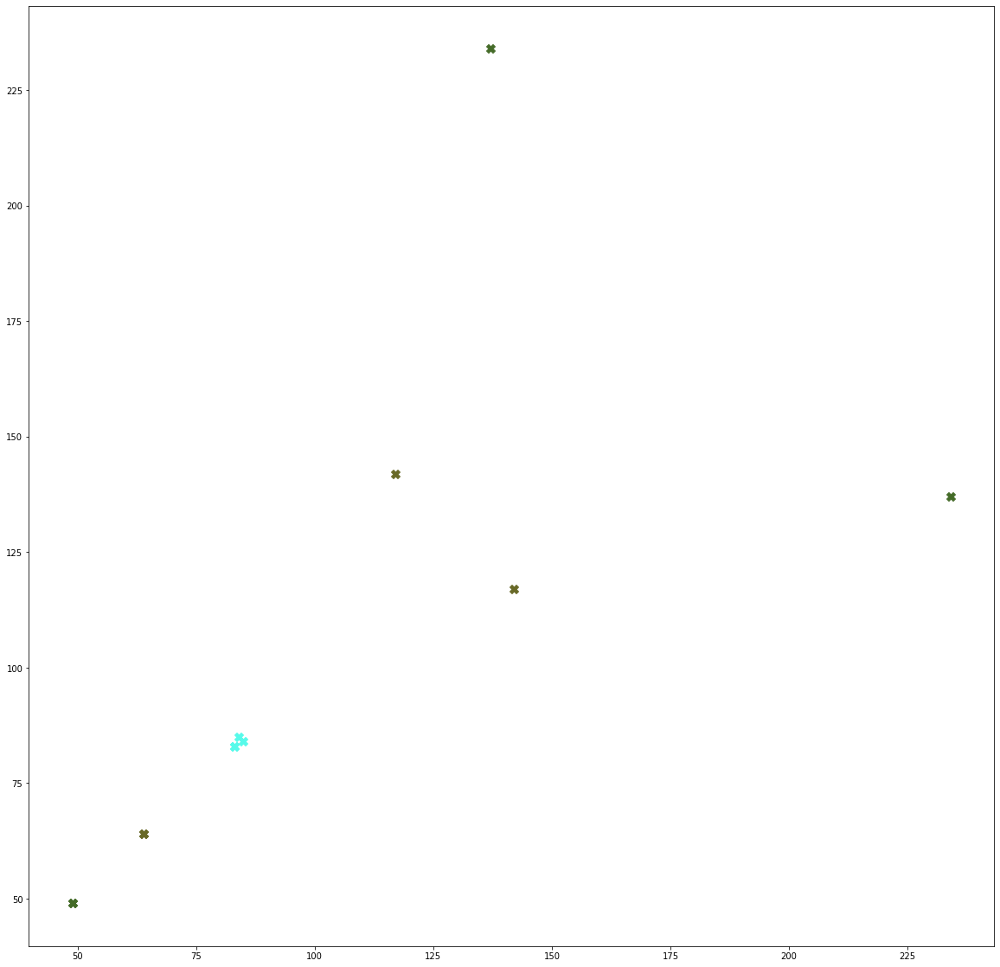

In [193]:
for bluriteration in [150 ]:
    mat = copy.deepcopy(globalmat)
    
    print('blurring')
    for k in range(int( bluriteration ) ):
        mat += np.dot(blurfactor*connectmat, mat )
    print(' done blurs',bluriteration ) 
    
    print('recursive clustering')
    cluster_labels = divide_clusters( subcluster( mat, calc_isomap= False , jaccard = False,  scale = False )  , mat.shape[1])
    print('done')
    
    #add the uinformative columns to -1
    cluster_labels[ np.sum(mat , axis = 0 ).flat == 0 ] = -1
    l,c = np.unique(cluster_labels, return_counts= True)
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for k in range(len(l))   ]
    print('labels' , l )
    print('counts' , c )
    if show_intra_clust_dist == True:
        for i,label in enumerate(list(l.flat)):
            if i < 10:
                if c[i]< 20 and c[i]>2:
                    print('intracluster dists: ' , label)
                    zeroed = np.where(cluster_labels == label )[0]
                    print(zeroed)
                    combos =  [ c for c in itertools.combinations(list(zeroed) , 2)]                        
                    if verbose == True:
                        
                        plt.figure(figsize=(30,10))
                        plt.imshow(mat[:,zeroed])
                        plt.show()
                        
                        plt.figure(figsize=(30,10))
                        plt.spy(mat[:,zeroed])    
                        plt.show()
                    
                    if len(combos)>3:
                        print(combos)
                        scrambled = []
                        distances = []
                        for combo in combos:
                            #find intracluster distances 
                            c1 = copy.deepcopy(mat[:,combo[0]])
                            c2 = copy.deepcopy(mat[:,combo[1]])
                            dist = scipy.spatial.distance.euclidean(c1, c2 )
                            c1_scramble = copy.deepcopy(mat[:,combo[0]])
                            c2_scramble = copy.deepcopy(mat[:,combo[1]])
                            distances.append( dist )
                            for shuffle in range(shuffleiter):
                                np.random.shuffle(c1_scramble)
                                np.random.shuffle(c2_scramble)
                                dist = scipy.spatial.distance.euclidean(c1_scramble, c2_scramble  )
                                scrambled.append( dist )
                        #fit gumbel

                        #cutoff w p val
                        
                            
                        scrambled = np.array(scrambled)
                        distances = np.array(distances)
                        
                        #add pval cutoff
                        plt.vlines()
                        plt.hist(scrambled , label = 'scrambled' , alpha = .5, density=True)
                        plt.hist(distances, label = 'coev' ,  alpha = .5, density=True)
                        plt.legend()
                        plt.title('cluster'+str(label))
                        plt.show()

    if show_mat == True:
        plt.figure(figsize=(45,100))
        for i,label in enumerate(list(l.flat)):
            mask = copy.deepcopy(globalmat)
            #mask = mask[:,non_gap]
            mask[:, label!=cluster_labels ] =0
            plt.spy(mask, markersize= .5 ,c=color[i] )
        plt.show()
    
    if show_hits == True:
        #start with intra
        for struct in subthresh_mats:
            if struct not in hits:
                hits[struct] = {}
            for chain in subthresh_mats[struct]:
                if chain not in hits:
                    hits[struct][chain] = {}
                print('calculating hits for chain, struct, blurs')
                print( chain, struct , bluriteration)
                reds, oranges, greens = struct_hits( cluster_labels=cluster_labels , distmats=subthresh_mats , struct=struct , chain=chain , l=l , c=c )
                hits[struct][chain][bluriteration]={'reds':reds ,'oranges':oranges , 'greens':greens}


<ipython-input-185-20bbc25f6f1a>:1: RuntimeWarning: invalid value encountered in true_divide
  green2red = np.divide( np.array(totalgreens) , np.array(totalreds)+np.array(totalgreens ) )


ValueError: x and y must have same first dimension, but have shapes (18,) and (0,)

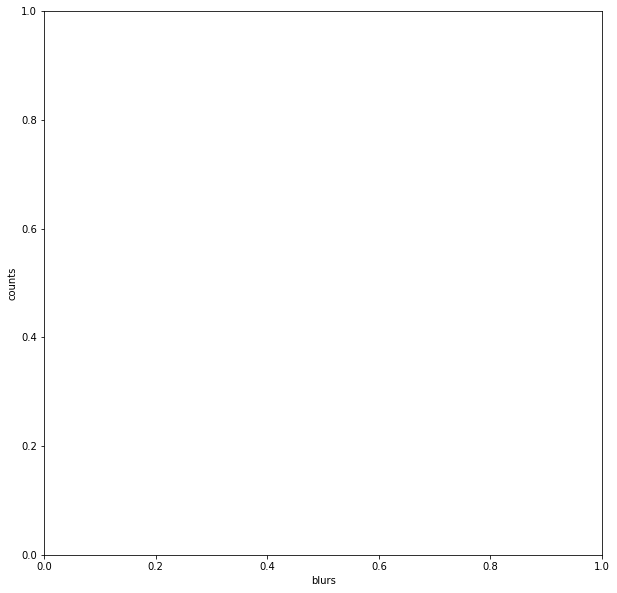

In [185]:

green2red = np.divide( np.array(totalgreens) , np.array(totalreds)+np.array(totalgreens ) )

bluriters = [1,5,10,20,30,40,50,60, 70 ,80 , 90, 100 ]+[100,110,120,130,140,150 ]

fig, ax1 = plt.subplots( figsize=(10,10))

ax1.set_xlabel('blurs')
ax1.set_ylabel('counts', color='black')
ax1.plot( bluriters,  totalgreens[1:] , color='green' , label= 'greens')
ax1.plot(bluriters,  totalreds[1:] , color='red', label = 'reds')
ax1.plot(bluriters, totaloranges[1:] , color='orange', label = 'oranges')

positives = np.array(totaloranges[1:]) + np.array(totalgreens[1:])
ax1.plot(bluriters, positives , color='orange' , linestyle='dashed' , label = "positives (g+o) ")


positives2red = np.divide( positives  ,positives + np.array(totalreds[1:])  )

ax1.tick_params(axis='y', labelcolor='black')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('green to red ratio', color='black')  # we already handled the x-label with ax1
ax2.set_ylim( (0,1.25))
ax2.plot( bluriters, green2red[1:] , linestyle='dashed'  , color='black' , label = 'green/green+red')
ax2.plot( bluriters , positives2red , linestyle='dotted'  , color='black' , label = 'positives/positives+red')

ax2.tick_params(axis='y', labelcolor='black')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
ax1.legend(loc='center right')
ax2.legend(loc='upper right')

plt.show()



In [ ]:
#optimize blur factor and blur iter as a function of tree branch length distribution

#

In [ ]:
#generate plot 